## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## 1. I'll compute the camera calibration using chessboard images

In [1]:
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
import glob

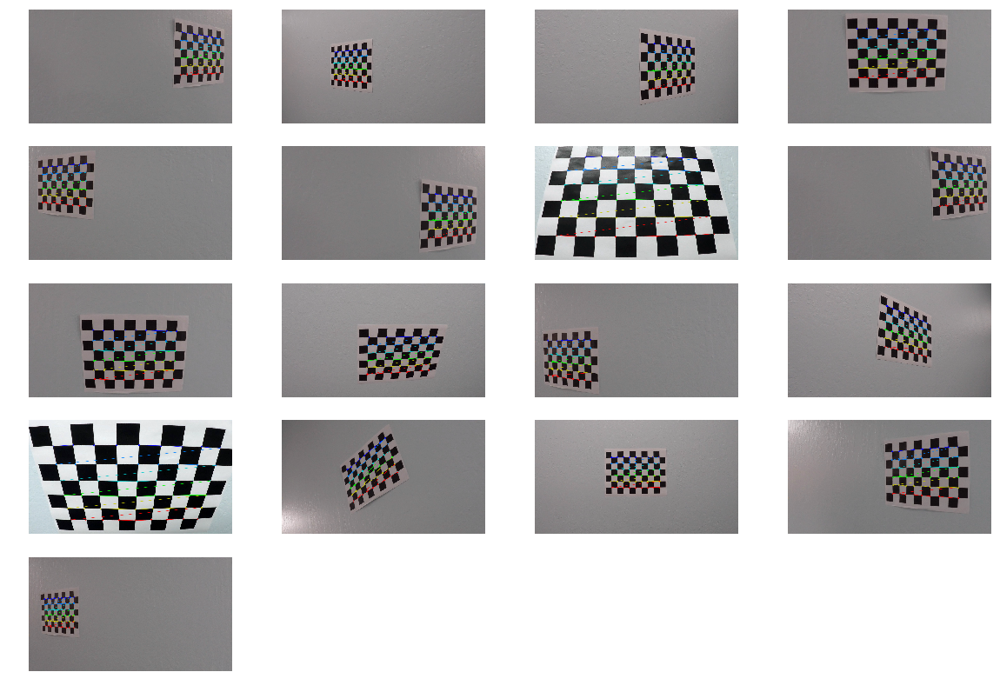

In [2]:
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

plt.figure(figsize=(20,14))
ind = 1

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        
        ax = plt.subplot(5,4,ind)
        plt.imshow(img)
        plt.axis('off')
        ind = ind + 1

plt.savefig('output_images/calibration_plot.png',bbox_inches='tight')
plt.show()

In [3]:
import pickle

img = cv2.imread('camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump(dist_pickle, open("camera_cal/dist_pickle.p", "wb"));

def undistort(img, mtx, dist):
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

def plot_compare(test_img, new_img, plot_title=None, n=0, add=0, left_fitx=None, right_fitx=None, ploty= None):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7))
    f.tight_layout()
    ax1.imshow(test_img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(new_img)
    ax2.set_title('{0}:'.format(plot_title), fontsize=30)
    
    if add==1:
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
    
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    f.savefig('output_images/'+plot_title+'.png',bbox_inches='tight')
    plt.show()

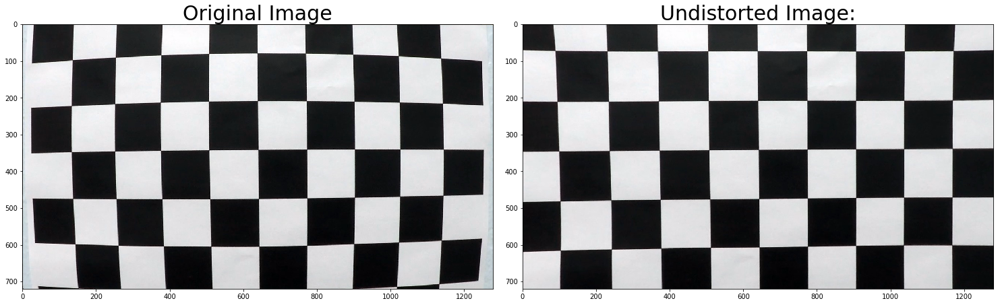

In [4]:
#load mtx, dist
dist_pickle = pickle.load(open("camera_cal/dist_pickle.p", "rb" ))
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

# apply a distortion correction to raw image
undistorted = undistort(img, mtx, dist)

plot_compare(img, undistorted, 'Undistorted Image')

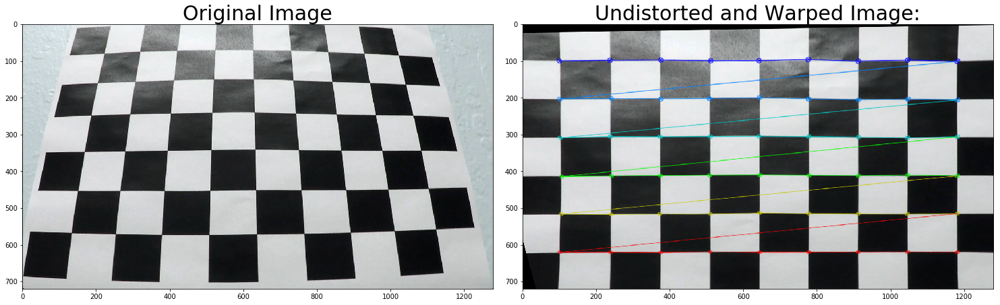

In [5]:
def corners_unwarp(img, mtx, dist):
    nx=9
    ny=6

    undist = cv2.undistort(img, mtx, dist, None, mtx)
    gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    if ret == True:
        cv2.drawChessboardCorners(undist, (nx, ny), corners, ret)
        offset = 100 # offset for dst points
        img_size = (gray.shape[1], gray.shape[0])

        src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
        dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                                     [img_size[0]-offset, img_size[1]-offset], 
                                     [offset, img_size[1]-offset]])
        M = cv2.getPerspectiveTransform(src, dst)
        warped = cv2.warpPerspective(undist, M, img_size)

    return warped, M

img = cv2.imread('camera_cal/calibration3.jpg')
top_down, perspective_M = corners_unwarp(img, mtx, dist)

plot_compare(img, top_down, 'Undistorted and Warped Image')

## 2. Pipeline on test image

In [6]:
# for video
class Line():
    
    def __init__(self):
        
        self.detected = False
        
        self.recent_xfits = []
        self.best_xfit = None
        
        self.current_fit_coeffs = [np.array([False])]
        self.best_fit_coeffs = None
                
        self.radius_of_curvature = None
        self.line_base_position = None
        
        self.allx = None
        self.ally = None
        
def verify_lane_width(left, right):
    if np.absolute(left - right) > 1100 | np.absolute(left - right) < 900:
        return True
    else:
        return False
    
def annotate(img, left_curverad, right_curverad, camera):
    font = cv2.FONT_HERSHEY_COMPLEX_SMALL
    cv2.putText(img, 'Left Radius of Curvature: {0:6f} meters'.format(left_curverad), (10,30), font, 1, (255,255,255), 2)
    cv2.putText(img, 'Right Radius of Curvature: {0:6f} meters'.format(right_curverad),(10,60), font, 1, (255,255,255), 2)
    cv2.putText(img, 'Camera Offset: {0:6f} meters'.format(camera), (10,90), font, 1, (255,255,255), 2)

In [7]:
LEFT = Line()
RIGHT = Line()

# define functions
def bgr_to_rgb(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

def abs_sobel_thresh(img, orient='x', thresh_min=15, thresh_max=255):
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))

    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    return binary_output

def gradient_magnitude(img, sobel_kernel=9, mag_thresh=(60, 255)):
    
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

def gradient_direction(img, sobel_kernel=9, thresh=(0.7, 1.1)):
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    return binary_output

def color_thresholds(img, thresh_s=(60, 255), thresh_v=(100,255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel > thresh_s[0]) & (s_channel <= thresh_s[1])] = 1
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    v_channel = hsv[:,:,2]
    v_binary = np.zeros_like(v_channel)
    v_binary[(v_channel > thresh_v[0]) & (v_channel <= thresh_v[1])] = 1  
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_binary == 1) & (v_binary == 1)] = 1
    return binary_output

def multi_thresholds(new_img):
    binary_x = abs_sobel_thresh(new_img, 'x')
    binary_y = abs_sobel_thresh(new_img, 'y')
    mag = gradient_magnitude(new_img)
    direct = gradient_direction(new_img)
    color = color_thresholds(new_img)
    new_img = cv2.cvtColor(new_img, cv2.COLOR_RGB2GRAY)
    binary_output = np.zeros_like(new_img)
    binary_output[(binary_x == 1) & (binary_y == 1) & (mag == 1) | (color == 1) | (mag == 1) & (direct == 1)] = 1
    return binary_output

def transform_perspective(img):
    width = img.shape[1]
    height = img.shape[0]
    src = np.array([[(width*0.4, height*0.65),
                        (width*0.6, height*0.65),
                        (width, height),
                        (0, height)]], 
                        dtype=np.float32)
    dst = np.array([[0,0], 
                    [img.shape[1], 0], 
                    [img.shape[1], img.shape[0]],
                    [0, img.shape[0]]],
                    dtype = 'float32')
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped_output = cv2.warpPerspective(img, M, (img.shape[1],img.shape[0]), flags=cv2.INTER_LINEAR)
    return warped_output, M, Minv    

def sliding_windows(binary_warped):
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    #For Video:
    LEFT.recent_xfits = [(left_fitx)]
    LEFT.best_xfit = np.mean(LEFT.recent_xfits)
    RIGHT.recent_xfits = [(right_fitx)]
    RIGHT.best_xfit = np.mean(RIGHT.recent_xfits)
        
    LEFT.current_fit_coeffs = [(left_fit)]
    LEFT.best_fit_coeffs = np.mean(LEFT.current_fit_coeffs)
    RIGHT.current_fit_coeffs = [(right_fit)]
    RIGHT.best_fit_coeffs = np.mean(RIGHT.current_fit_coeffs)
    
    LEFT.line_base_position = leftx_current
    RIGHT.line_base_position = rightx_current
    
    LEFT.allx = leftx
    LEFT.ally = lefty
    RIGHT.allx = rightx
    RIGHT.ally = righty
    
    return out_img, ploty, left_fitx, right_fitx, left_fit, right_fit, leftx, rightx, leftx_base, rightx_base

def shaded_lanes(binary_warped, left_fit, right_fit):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    return result, ploty, left_fitx, right_fitx, left_fit, right_fit

def roc_in_pixels(ploty, left_fit, right_fit, leftx, rightx):
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    return left_curverad, right_curverad

def roc_in_meters(ploty, left_fit, right_fit, leftx, rightx):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/900 # meters per pixel in x dimension
    y_eval = np.max(ploty)
    leftx = np.array(leftx, dtype=np.float32)
    rightx = np.array(rightx, dtype=np.float32)
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(leftx*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(rightx*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    return left_curverad, right_curverad

# region of interest
def region_of_interest_left(img):
    width = img.shape[1]
    height = img.shape[0]
    vertices = np.array([[(width*0.49, height*0.55),
                        (width*0.49, height*0.55),
                        (width*0.3, height),
                        (width*0.15, height)]], 
                        dtype=np.int32)
    mask = np.zeros_like(img)   
    if len(img.shape) > 2:
        channel_count = img.shape[2]
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    masked_image_left = cv2.bitwise_and(img, mask)
    return masked_image_left

def region_of_interest_right(img):
    width = img.shape[1]
    height = img.shape[0]
    vertices = np.array([[(width*0.51, height*0.55),
                        (width*0.51, height*0.55),
                        (width*0.95, height),
                        (width*0.8, height)]], 
                        dtype=np.int32)
    mask = np.zeros_like(img)   
    if len(img.shape) > 2:
        channel_count = img.shape[2]
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    masked_image_right = cv2.bitwise_and(img, mask)
    return masked_image_right

def region_of_interest(img):
    mask_left = region_of_interest_left(img)
    mask_right = region_of_interest_right(img)
    masked_image = cv2.addWeighted(mask_left, 1.0, mask_right, 1.0, 0)
    return masked_image

def offset(img_center, leftx_base, rightx_base):
    poly_center = (leftx_base + rightx_base) / 2
    diff_pix = img_center - poly_center
    xm_per_pix = 3.5/1000
    offset = diff_pix * xm_per_pix
    return offset

def lane_mapping(img_shape, warped, Minv, ploty, left_fitx, right_fitx, undistorted):
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255,0)) 
    newwarp = cv2.warpPerspective(color_warp, Minv, (img_shape[1], img_shape[0])) 
    out_img = cv2.addWeighted(undistorted, 1, newwarp, 0.3, 0)
    return out_img



In [8]:
# define pipeline
def pipeline(action=None, nplot='single'):
    
    test_images = glob.glob('test_images/*.jpg')
    n = 0
    for img in test_images:
        print(img)
        img = cv2.imread(img)
        test_img = bgr_to_rgb(img)
        if action == 'Undistorted':
            new_img = undistort(img, mtx, dist)
            plot_compare(test_img, cv2.cvtColor(new_img, cv2.COLOR_BGR2RGB), action, n)
            if nplot == 'single':
                break
        if action == 'Sobel X':
            new_img = abs_sobel_thresh(img, 'x')
            plot_compare(test_img, new_img, action, n)
            if nplot == 'single':
                break
        if action == 'Sobel Y':
            new_img = abs_sobel_thresh(img, 'y', 40, 255)
            plot_compare(test_img, new_img, action, n)
            if nplot == 'single':
                break
        if action == 'Gradient Magnitude':
            new_img = gradient_magnitude(img)
            plot_compare(test_img, new_img, action, n)
            if nplot == 'single':
                break
        if action == 'Gradient Direction':
            new_img = gradient_direction(img)
            plot_compare(test_img, new_img, action, n)
            if nplot == 'single':
                break
        if action == 'Color Thresholds':
            new_img = color_thresholds(img)
            plot_compare(test_img, new_img, action, n)
            if nplot == 'single':
                break
        if action == 'Multi Thresholds':
            new_img = undistort(img, mtx, dist)
            new_img = multi_thresholds(new_img)
            plot_compare(test_img, new_img, action, n)
            if nplot == 'single':
                break
                
        if action == 'Region Masking':
            new_img = undistort(img, mtx, dist)
            new_img = multi_thresholds(new_img)
            new_img = region_of_interest(new_img)
            plot_compare(test_img, new_img, action, n)
            if nplot == 'single':
                break
                
        if action == 'Perspective Transform':
            new_img = undistort(img, mtx, dist)
            new_img = multi_thresholds(new_img)
            new_img = region_of_interest(new_img)
            new_img, M, Minv = transform_perspective(new_img)
            plot_compare(test_img, new_img, action, n)
            if nplot == 'single':
                break
            
        if action == 'Sliding Windows':
            new_img = undistort(img, mtx, dist)
            new_img = multi_thresholds(new_img)
            new_img = region_of_interest(new_img)
            new_img, M, Minv = transform_perspective(new_img)
            add = 1
            windows_img, ploty, left_fitx, right_fitx, left_fit, right_fit, leftx, rightx, leftx_base, rightx_base = sliding_windows(new_img)
            plot_compare(test_img, windows_img, action, n, add, left_fitx, right_fitx, ploty)
            if nplot == 'single':
                break
        
        if action == 'Shaded Lanes':
            new_img = undistort(img, mtx, dist)
            new_img = multi_thresholds(new_img)
            new_img = region_of_interest(new_img)
            new_img, M, Minv = transform_perspective(new_img)
            windows_img, ploty, left_fitx, right_fitx, left_fit, right_fit, leftx, rightx, leftx_base, rightx_base = sliding_windows(new_img)
            shades_img, ploty, left_fitx, right_fitx,left_fit, right_fit = shaded_lanes(new_img, left_fit, right_fit)
            add=1
            plot_compare(test_img, shades_img, action, n, add, left_fitx, right_fitx, ploty)
            if nplot == 'single':
                break
        if action == 'Radius of Curvature in Pixels':
            new_img = undistort(img, mtx, dist)
            new_img = multi_thresholds(new_img)
            new_img = region_of_interest(new_img)
            new_img, M, Minv = transform_perspective(new_img)
            windows_img, ploty, left_fitx, right_fitx, left_fit, right_fit, leftx, rightx,leftx_base, rightx_base = sliding_windows(new_img)
            left_curverad, right_curverad = roc_in_pixels(ploty, left_fit, right_fit, leftx, rightx)
            print('Left Radius of Curvature: {0:2f} pixels\nRight Radius of Curvature: {1:2f} pixels\n'.format(left_curverad, right_curverad))
            if nplot == 'single':
                break
        if action == 'Radius of Curvature in Meters':
            new_img = undistort(img, mtx, dist)
            new_img = multi_thresholds(new_img)
            new_img = region_of_interest(new_img)
            new_img, M, Minv = transform_perspective(new_img)
            windows_img, ploty, left_fitx, right_fitx, left_fit, right_fit, leftx,rightx, leftx_base, rightx_base = sliding_windows(new_img)
            left_curverad, right_curverad = roc_in_meters(ploty, left_fit, right_fit, leftx, rightx)
            print('Left Radius of Curvature: {0:2f} meters\nRight Radius of Curvature: {1:2f} meters\n'.format(left_curverad, right_curverad))
            if nplot == 'single':
                break
        if action == 'Camera Offset':
            new_img = undistort(img, mtx, dist)
            new_img = multi_thresholds(new_img)
            new_img = region_of_interest(new_img)
            new_img, M, Minv = transform_perspective(new_img)
            windows_img, ploty, left_fitx, right_fitx, left_fit, right_fit, leftx, rightx, leftx_base, rightx_base = sliding_windows(new_img)
            width = img.shape[1]
            img_center = width/2
            camera = offset(img_center, leftx_base, rightx_base)
            print('Test Image: {0}\nOffset from Lane Center: {1:2f} meters\n'.format(n+1, camera))
            if nplot == 'single':
                break
        if action == 'Lane Mapping':
            undistorted_img = undistort(img, mtx, dist)
            new_img = multi_thresholds(undistorted_img)
            new_img = region_of_interest(new_img)
            warped_img, M, Minv = transform_perspective(new_img)
            new_img, ploty, left_fitx, right_fitx, left_fit, right_fit, leftx, rightx, leftx_base, rightx_base = sliding_windows(warped_img)
            new_img = lane_mapping(img.shape[:2], warped_img, Minv, ploty, left_fitx, right_fitx, cv2.cvtColor(undistorted_img, cv2.COLOR_BGR2RGB))
            plot_compare(test_img, new_img, action, n)
            if nplot == 'single':
                break
        n += 1

test_images/test6.jpg


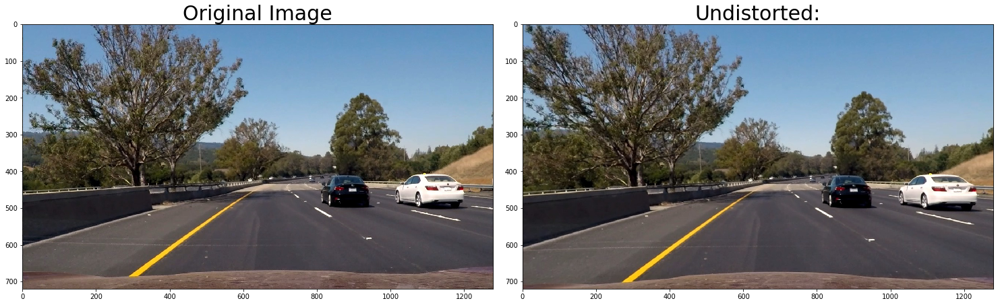

In [9]:
pipeline(action='Undistorted')

test_images/test6.jpg


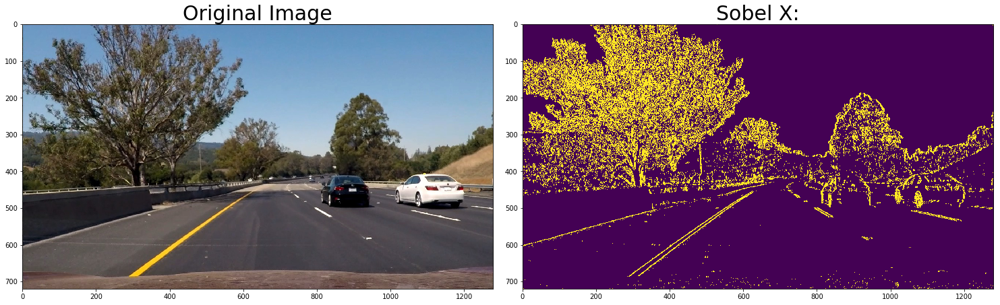

In [10]:
pipeline(action='Sobel X')

test_images/test6.jpg


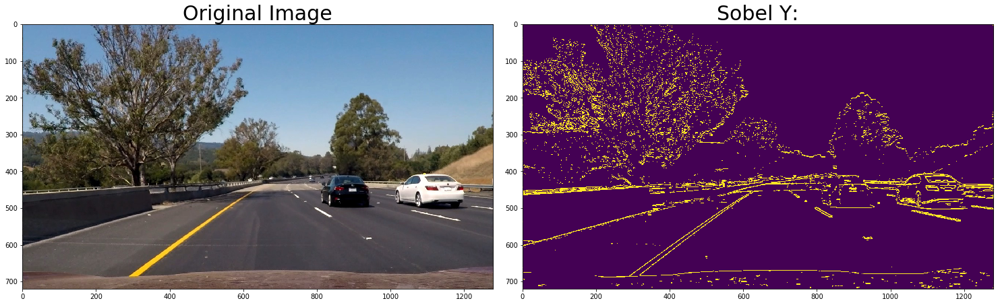

In [11]:
pipeline(action='Sobel Y')

test_images/test6.jpg


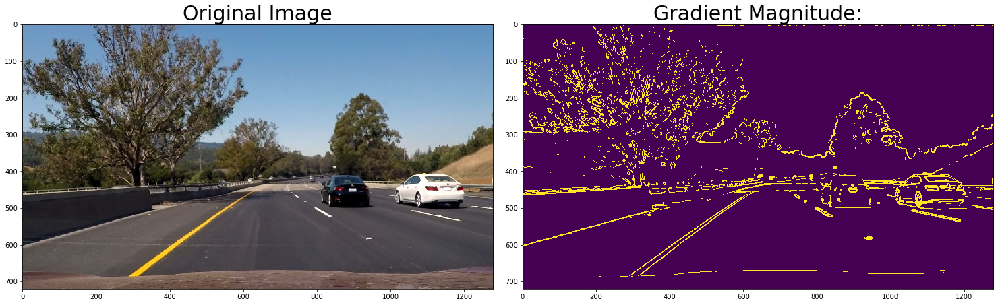

In [12]:
pipeline(action='Gradient Magnitude')

test_images/test6.jpg


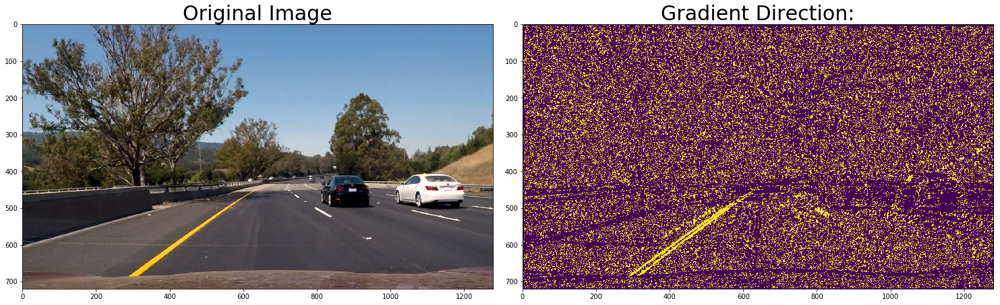

In [13]:
pipeline(action='Gradient Direction')

test_images/test6.jpg


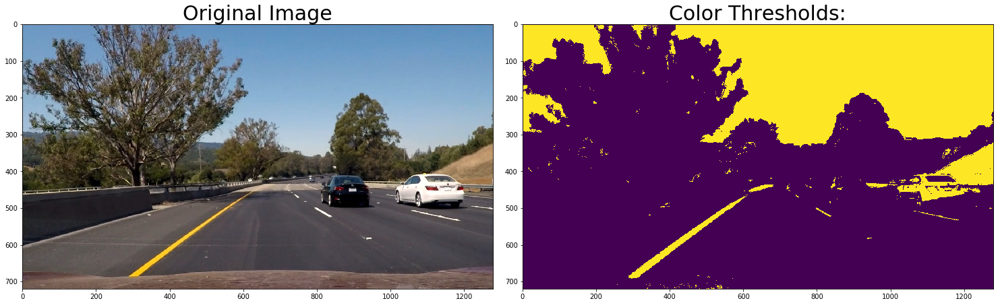

In [14]:
pipeline(action='Color Thresholds')

test_images/test6.jpg


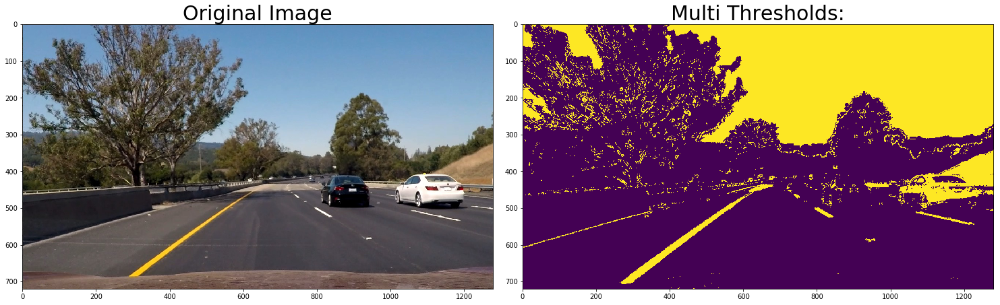

In [15]:
pipeline(action='Multi Thresholds')

test_images/test6.jpg


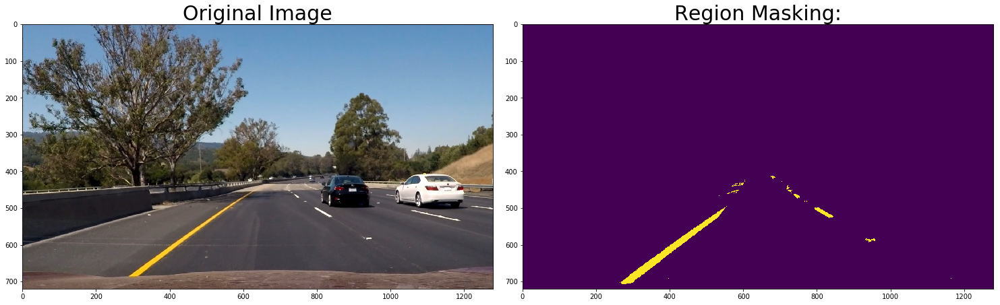

In [16]:
pipeline(action='Region Masking')

test_images/test6.jpg


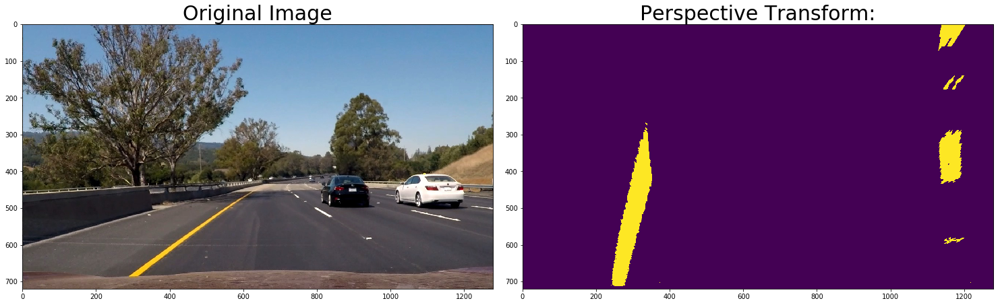

In [17]:
pipeline(action='Perspective Transform')

test_images/test6.jpg


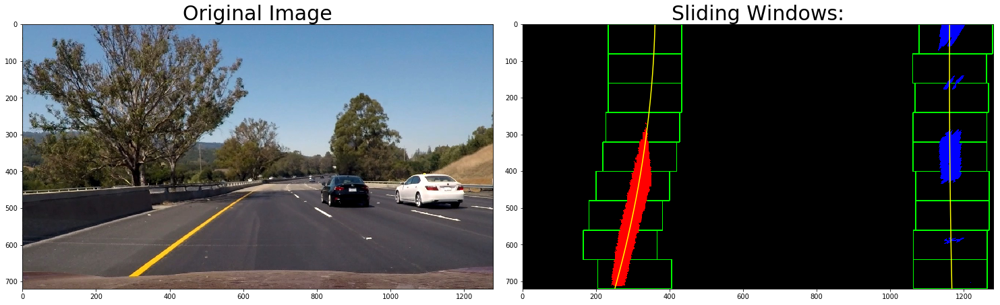

In [18]:
pipeline(action='Sliding Windows')

test_images/test6.jpg


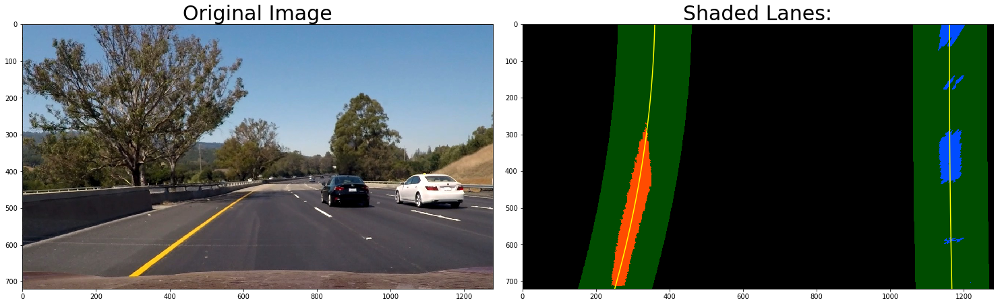

In [19]:
pipeline(action='Shaded Lanes')

In [20]:
pipeline(action='Radius of Curvature in Pixels')

test_images/test6.jpg
Left Radius of Curvature: 3179.523074 pixels
Right Radius of Curvature: 26621.883482 pixels



In [21]:
pipeline(action='Radius of Curvature in Meters')

test_images/test6.jpg
Left Radius of Curvature: 200.191831 meters
Right Radius of Curvature: 742.249854 meters



/root/miniconda3/envs/carnd-term1/lib/python3.5/site-packages/ipykernel_launcher.py:255: RankWarning: Polyfit may be poorly conditioned
/root/miniconda3/envs/carnd-term1/lib/python3.5/site-packages/ipykernel_launcher.py:256: RankWarning: Polyfit may be poorly conditioned


In [22]:
pipeline(action='Camera Offset')

test_images/test6.jpg
Test Image: 1
Offset from Lane Center: -0.323750 meters



test_images/test6.jpg


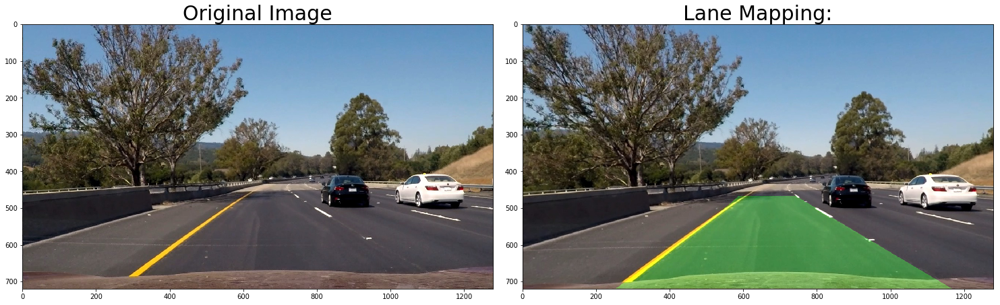

In [23]:
pipeline(action='Lane Mapping')

## 3. Pipeline on test video

In [24]:
best_fit_test_images = glob.glob('output_images/test*_top_view.jpg')
n_frames = 0

def video_pipeline(img):
    global n_frames
    if n_frames == 0:
        undistorted = undistort(img, mtx, dist)
        binary_thresholded = multi_thresholds(undistorted)
        warped, M, Minv = transform_perspective(binary_thresholded)
        windows_img, ploty, left_fitx, right_fitx, left_fit, right_fit, leftx, rightx, leftx_base, rightx_base = sliding_windows(warped)   
        left_curverad, right_curverad = roc_in_meters(ploty, left_fit, right_fit, leftx, rightx)
        camera = offset(img.shape[1]/2, leftx_base, rightx_base)
        out_img = lane_mapping(img.shape[:2], warped, Minv, ploty, left_fitx, right_fitx, undistorted)
        annotate(out_img, left_curverad, right_curverad, camera)
    else:
        undistorted = undistort(img, mtx, dist)
        binary_thresholded = multi_thresholds(undistorted)
        region = region_of_interest(binary_thresholded)
        warped, M, Minv = transform_perspective(region)
        binary_warped = warped
        
        if LEFT.detected == True:
            left_fit = LEFT.current_fit_coeffs
        else:
            left_fit = LEFT.best_fit_coeffs
        
        if RIGHT.detected == True:
            right_fit = RIGHT.current_fit_coeffs
        else:
            right_fit = RIGHT.best_fit_coeffs
        
        windows_img, ploty, left_fitx, right_fitx, left_fit, right_fit, leftx, rightx, leftx_base, rightx_base = sliding_windows(warped)   

        if LEFT.detected == True:
            LEFT.recent_xfits.append((left_fitx))
            LEFT.best_xfit = np.mean(LEFT.recent_xfits)
            LEFT.current_fit_coeffs.append((left_fit))
            LEFT.best_fit_coeffs = np.mean(LEFT.current_fit_coeffs)
            LEFT.line_base_position = leftx_current
            LEFT.allx = leftx
            LEFT.ally = lefty
        else:
            left_fitx = LEFT.best_xfit
            left_fit = LEFT.best_fit_coeffs
            leftx_current = LEFT.line_base_position
            leftx = LEFT.allx
            lefty = LEFT.ally   
        if RIGHT.detected == True:
            RIGHT.recent_xfits.append((right_fitx))
            RIGHT.best_xfit = np.mean(RIGHT.recent_xfits)
            RIGHT.current_fit_coeffs.append((right_fit))
            RIGHT.best_fit_coeffs = np.mean(RIGHT.current_fit_coeffs)
            RIGHT.line_base_position = rightx_current
            RIGHT.allx = rightx
            RIGHT.ally = righty   
        else:
            right_fitx = RIGHT.best_xfit
            right_fit = RIGHT.best_fit_coeffs
            rightx_current = RIGHT.line_base_position
            rightx = RIGHT.allx
            righty = RIGHT.ally
            
        is_lane_width_correct = verify_lane_width(LEFT.line_base_position, RIGHT.line_base_position)
        if is_lane_width_correct == True:
            LEFT.detected = True
            RIGHT.detected = True
        else:
            LEFT.detected = False
            RIGHT.detected = False
                
        left_curverad, right_curverad =  roc_in_meters(ploty, left_fit, right_fit, leftx, rightx)
        LEFT.radius_of_curvature = left_curverad
        RIGHT.radius_of_curvature = right_curverad
        
        leftx_base = leftx_current
        rightx_base = rightx_current
        camera = offset(img.shape[1]/2, leftx_base, rightx_base, n_frames)
        
        out_img = lane_mapping(img.shape[:2], warped, Minv, ploty, left_fitx, right_fitx, undistorted)
        annotate(out_img, left_curverad, right_curverad, camera)    
    return out_img

In [25]:
from moviepy.editor import VideoFileClip

video_output = 'project_video_output.mp4'
clip = VideoFileClip('project_video.mp4')

output_clip = clip.fl_image(video_pipeline)
%time output_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [17:46<00:00,  1.21it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 16min 4s, sys: 740 ms, total: 16min 5s
Wall time: 17min 49s


In [26]:
from moviepy.editor import VideoFileClip

video_output = 'challenge_video_output.mp4'
clip = VideoFileClip('challenge_video.mp4')

output_clip = clip.fl_image(video_pipeline)
%time output_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video challenge_video_output.mp4
[MoviePy] Writing video challenge_video_output.mp4


100%|██████████| 485/485 [06:47<00:00,  1.19it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_output.mp4 

CPU times: user 6min 11s, sys: 260 ms, total: 6min 12s
Wall time: 6min 50s
